# 1 - import python libraries

In [1]:
# import python libraries
try:

    from sklearn.model_selection import GridSearchCV
    from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
    # from mpl_toolkits.axes_grid1.colorbar import colorbar
    from IPython.display import display, clear_output
    from matplotlib import collections as cplt
    from rasterio.plot import show, show_hist
    from matplotlib.patches import Rectangle
    import matplotlib.gridspec as gridspec
    import matplotlib.patches as patches
    from descartes import PolygonPatch
    from sklearn.cluster import KMeans
    import matplotlib.pyplot as plt
    from termcolor import colored
    from matplotlib import colors
    from time import perf_counter
    import ipywidgets as widgets
    from sklearn.svm import SVC
    import matplotlib as mpl
    import geopandas as gpd
    from skimage import io
    from osgeo import gdal
    import rasterio.mask
    import scipy.ndimage
    import pandas as pd
    import numpy as np
    import matplotlib
    import rasterio
    import shapely
    import sklearn
    import folium
    import random
    import fiona
    import glob
    %matplotlib inline
    
    import pickle
    
    from pylab import rcParams
    import seaborn as sb
    
    from rasterio.warp import calculate_default_transform, reproject, Resampling

#     import numpy as np
#     import pandas as pd
    from pandas import Series, DataFrame
#     import matplotlib.pyplot as plt
    from scipy import stats

#     import sklearn
    from sklearn import preprocessing
    from sklearn.preprocessing import scale
    from sklearn.preprocessing import MinMaxScaler
    
    import skimage.exposure as exposure
    
    import math
    
    from numpy import dstack


except ModuleNotFoundError:
    print(colored('Module import error'))
else:
    print(colored('\All modules properly loaded. Ready to start!!','green'))

<ipython-input-1-33cdcd621ade>:6: MatplotlibDeprecationWarning: 
The mpl_toolkits.axes_grid1.colorbar module was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use matplotlib.colorbar instead.
  from mpl_toolkits.axes_grid1.colorbar import colorbar


\All modules properly loaded. Ready to start!!


### Project folders and common variables

In [2]:
dsname='20200226T071450' #chanhe everytime
out_folder=r'C:\Users\Vincenzo\Documents\jupyter_beems\empirical\2_pipeline\code4_BEEMS_UnsupervisedClassification\out/'
store_folder=r'C:\Users\Vincenzo\Documents\jupyter_beems\empirical\2_pipeline\code4_BEEMS_UnsupervisedClassification\store/'

# 2 - Load Aux Data

visualize an interactive map which shows the ROI on which perform the analysis. (N.B. It require an improvement which is not cropping the data with respect to the ROI)

2.1 Import ROI shapefiles 

## DEBUG
insert the dsname here

In [3]:
# # debug for judhean foothill
# # debug da sostituire con riga sotto alla fine
StudyA=gpd.read_file(r'../Data/Shape/20200226T071450/JudeanFoothill_071450_ROI.shp')


# StudyA=gpd.read_file(r'C:\Users\Vincenzo\Documents\jupyter_beems\empirical\0_data\Shape\20200226T071450\JudeanFoothill_071450_ROI.shp')
# StudyB=gpd.read_file(r'C:\Users\Vincenzo\Documents\jupyter_beems\empirical\0_data\Shape\20200226T071450/JudeanFoothill_071450_almonds.shp')
# StudyC=gpd.read_file(r'C:\Users\Vincenzo\Documents\jupyter_beems\empirical\0_data\Shape\20200226T071450/JudeanFoothill_071450_natural.shp')
    

In [5]:
# #Store geometry information to be used later in GeoJSON format

geomSA=[]
coord = shapely.geometry.mapping(StudyA)["features"][0]["geometry"]
geomSA.append(coord)
print(colored(' Coordinates object: ', 'blue'), coord, colored('|  geomSA object: ', 'blue'),geomSA, '\n')

# geomSB=[]
# coordB = shapely.geometry.mapping(StudyB)["features"][0]["geometry"]
# geomSB.append(coordB)

# geomSC=[]
# coordC = shapely.geometry.mapping(StudyC)["features"][0]["geometry"]
# geomSC.append(coordC)

#Create variable with size of the studyarea in pixel coordinates for plot
rect = patches.Rectangle((5010,1147),1251,1523, linewidth=2, edgecolor='r', facecolor='none')
print(colored(' Rect object: ', 'blue'), rect, '\n')
#interactive visualization
mapA=folium.Map([32, 34],zoom_start=5,titles='cartodbposition',scrollWheelZoom=True)
folium.GeoJson(StudyA).add_to(mapA)
# folium.GeoJson(StudyB).add_to(mapA)
# folium.GeoJson(StudyC).add_to(mapA)
folium.GeoJson(StudyA.centroid, popup="<i>BEEMS project</i>",).add_to(mapA)
mapA


 Coordinates object:  {'type': 'Polygon', 'coordinates': (((672583.0, 3493406.0), (672633.0, 3493406.0), (672633.0, 3493316.0), (672583.0, 3493316.0), (672583.0, 3493406.0)),)} |  geomSA object:  [{'type': 'Polygon', 'coordinates': (((672583.0, 3493406.0), (672633.0, 3493406.0), (672633.0, 3493316.0), (672583.0, 3493316.0), (672583.0, 3493406.0)),)}] 

 Rect object:  Rectangle(xy=(5010, 1147), width=1251, height=1523, angle=0) 



# 3 - LOAD RASTER

<ul>
    <li>Raster_path is a class 'str'
        <li>S_files is a class 'list' like [strImA, strImB, ..., strImN].
            <li>S_import is a class 'rasterio.io.DatasetReader' that is a simple reader of tiff data.</li><li>S_mask is a class 'numpy.ndarray' of a single raster data of (1, rows, cols). It has shape attribute.</li><li> S_images is a class 'list' of nd arrays. It has attribute len(). Each ndArray has shape of (band, rows, cols).</li>
    </ul>
    
    S_images is the main data
    S_images_masked is the main data


## Select the Raster file acquired by the Slantrange camera (6 bands)

## Visualize raw raster data (can be switched off)
output are S_files, S_import, S_narray, S_mask, S_mask_corr

## DEBUG

In [94]:
#debug create list with images(s) to be analyzed
S_files=[f for f in glob.glob(r'../Data/Raster/20200226T071450/' + "*", recursive=True)]
print(colored('\n Files to be processed: ','blue'), *S_files, sep="\n")


 Files to be processed: 
C:\Users\Vincenzo\Documents\jupyter_beems\empirical\0_data\Raster\20200224T113048\20200224T113048_Ortho_1_28cm.tif



 Imported data info (S_import):  19870 27002 6 (0.012838000000000307, 0.012838000000003551) EPSG:32636 ('uint8', 'uint8', 'uint8', 'uint8', 'uint8', 'uint8') None

 Imported data NODATA info (S_import):  None


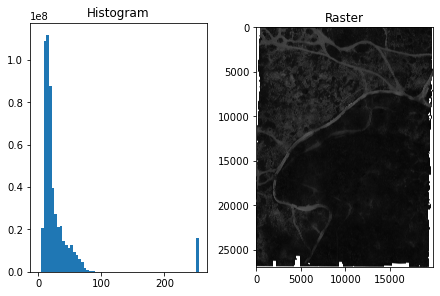

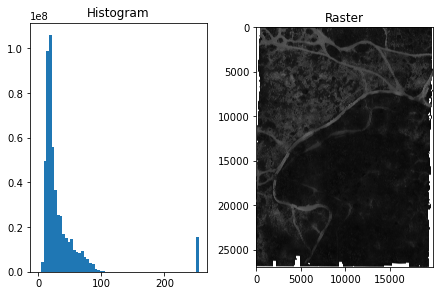

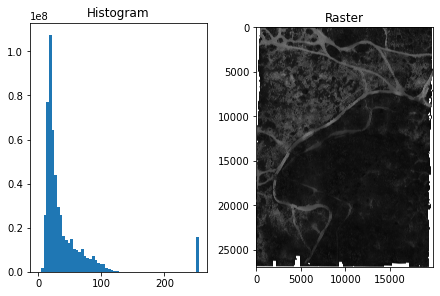

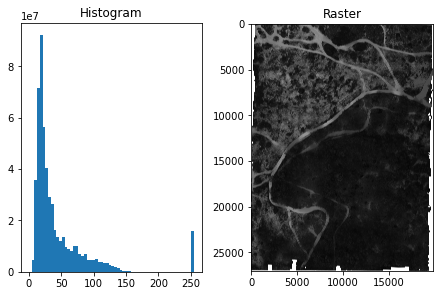

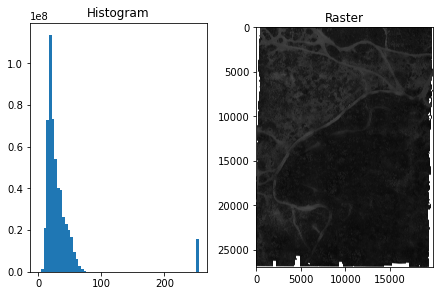

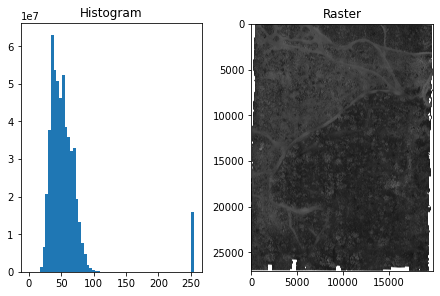

 Coordinates object:  {'type': 'Polygon', 'coordinates': (((677210.06637025, 3586135.07448008), (677210.06637025, 3586307.3196293795), (677325.2844093088, 3586307.3196293795), (677325.2844093088, 3586135.07448008), (677210.06637025, 3586135.07448008)),)} |  geomSA object:  [{'type': 'Polygon', 'coordinates': (((677210.06637025, 3586135.07448008), (677210.06637025, 3586307.3196293795), (677325.2844093088, 3586307.3196293795), (677325.2844093088, 3586135.07448008), (677210.06637025, 3586135.07448008)),)}] 

 Masked data info:  (6, 13418, 8976) uint8 3 722639808 1


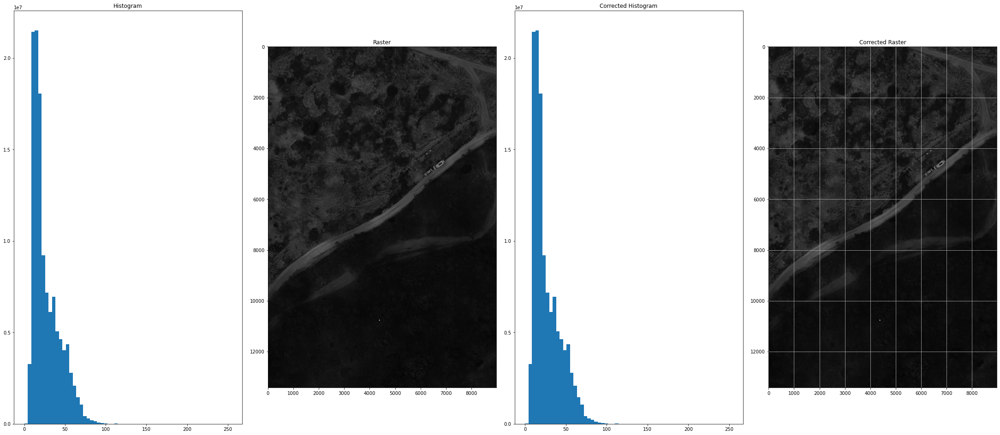

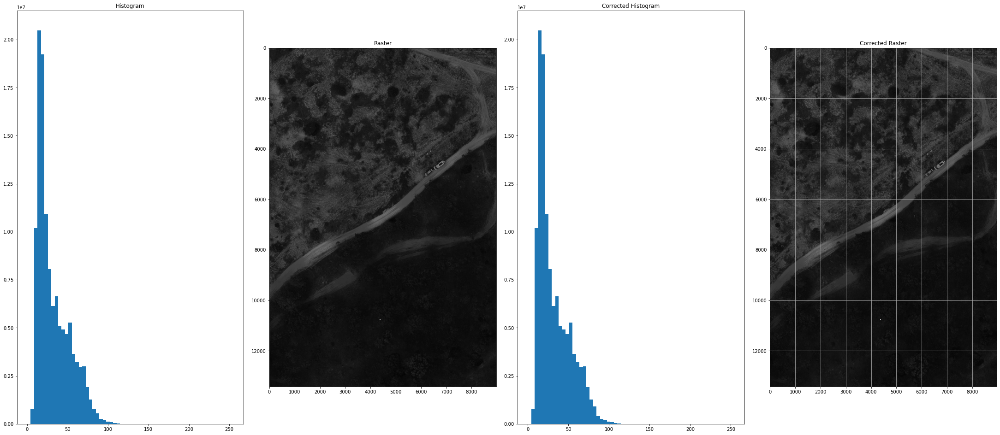

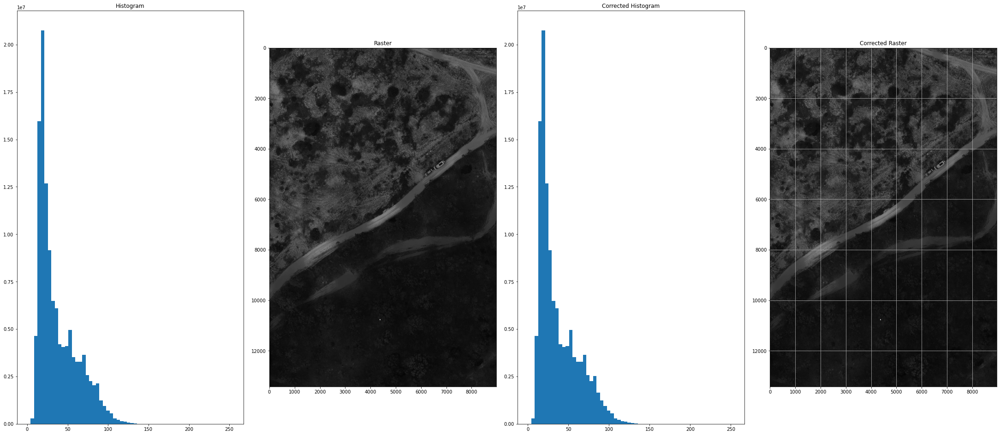

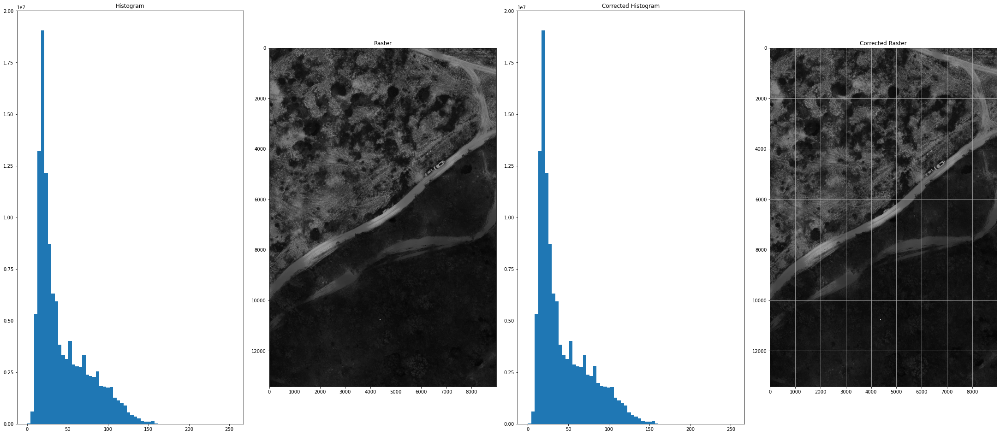

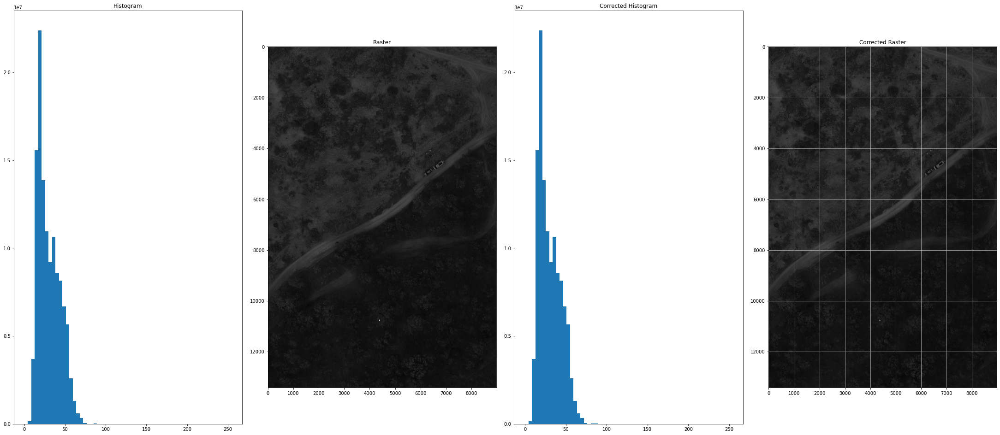

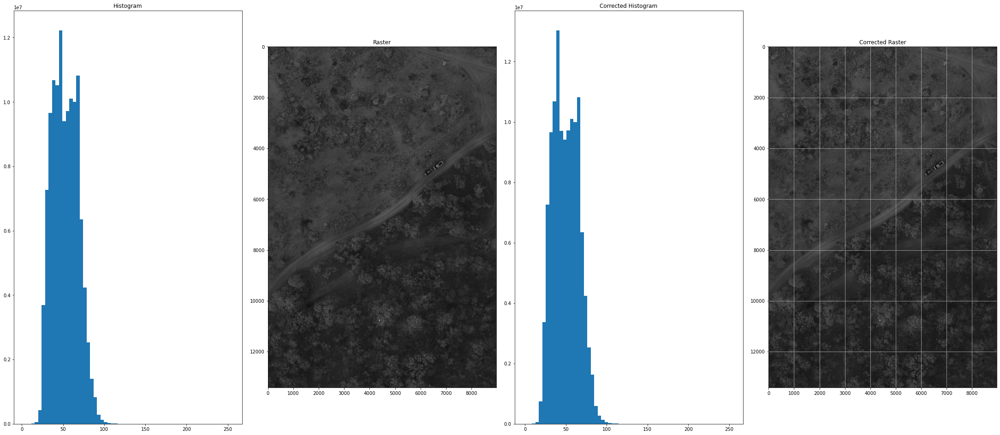

In [7]:
#import image(s) in Python and crop it using Study Area geomtry (geomSA) as mask

for i in range(len(S_files)):
    S_import=rasterio.open(S_files[i]) # is a DATASET RASTER OBJECT
    print(colored('\n Imported data info (S_import): ','blue'), S_import.width, S_import.height, S_import.count, S_import.res,S_import.crs,S_import.dtypes,S_import.nodata)
    print(colored('\n Imported data NODATA info (S_import): ','blue'), S_import.nodata)
    S_narray=S_import.read()
    dst_crs=S_import.crs #usefull latrer for dsm
    
    #change exposure between percentile
    val1,val2 = np.percentile(S_narray, (2.5,97.5))
    S_narray_exposure = exposure.rescale_intensity(S_narray, in_range=(val1,val2))
   
    for j in range(S_import.count):
        
        fig1, f1_axes = plt.subplots(ncols=2, nrows=1, constrained_layout=True)

        f1_axes[0].hist(S_narray[j].reshape(-1,1),bins=60)
        f1_axes[0].title.set_text('Histogram')
        f1_axes[1].imshow(S_narray[j],cmap='gray')
        f1_axes[1].title.set_text('Raster')
       
        
        plt.show()
        
        for ax in f1_axes.flat:
            ax.grid(True, linestyle='-.')
            
            

    #The raster object can be masked with a shapefile. The output is no more a dataset object but an NDARRAY
    geomSA=[]
    coord = shapely.geometry.mapping(StudyA)["features"][0]["geometry"]
    geomSA.append(coord)
    print(colored(' Coordinates object: ', 'blue'), coord, colored('|  geomSA object: ', 'blue'),geomSA, '\n')

    S_mask, out_transform = rasterio.mask.mask(S_import,geomSA,crop=True, all_touched=True) #, nodata=1) #is an nd ARRAY OBJECT
    print(colored(' Masked data info: ','blue'), S_mask.shape,S_mask.dtype, S_mask.ndim,S_mask.size, S_mask.itemsize)
    
    #The raster can be strecthed or corrected (exposure) #
    S_mask_corr=[]

    for j in range(S_import.count):
        # N.B. chose between rescale method
#         val1,val2 = np.percentile(S_mask[j], (2.5,97.5))

#         mask_exposure = exposure.rescale_intensity(S_mask[j], in_range=(val1,val2), out_range=(0,255))
        mask_exposure = exposure.rescale_intensity(S_mask[j], in_range=(S_mask[j].min(),S_mask[j].max()), out_range=(0,254))
        S_mask_corr.append(mask_exposure)
        
        # comment or de-comment for plotting or saving time during debugging
        
        fig2, axes = plt.subplots(ncols=4, nrows=1, figsize=(30,13), constrained_layout=True)

        axes[0].hist(S_mask[j].reshape(-1,1),bins=60)
        axes[0].title.set_text('Histogram')
        axes[1].imshow(S_mask[j], cmap='gray')
        axes[1].title.set_text('Raster') 
        axes[2].hist(S_mask_corr[j].reshape(-1,1),bins=60)
        axes[2].title.set_text('Corrected Histogram')  
        axes[3].imshow(S_mask_corr[j],cmap='gray')
        axes[3].title.set_text('Corrected Raster')
        plt.grid(True)
        plt.show()


del S_import
del S_narray
del coord

# 4 - Compute Index map combining the six bands

the input data could be 1) S_mask or 2) S_mask_corr which are the masked raster of the ROI geomSA.

In [8]:
import importlib
import spectralidx as spix
importlib.reload(spix)
# from spectralidx import *

changed9
changed9


<module 'spectralidx' from 'C:\\Users\\Vincenzo\\Documents\\jupyter_beems\\empirical\\1_code\\spectralidx.py'>

There arent nan or inf in 0
There arent nan or inf in 1
There arent nan or inf in 2
There arent nan or inf in 3
There arent nan or inf in 4
There arent nan or inf in 5
There arent nan or inf in 6
There arent nan or inf in 7
There arent nan or inf in 8
There arent nan or inf in 9
There arent nan or inf in 10
There arent nan or inf in 11
There arent nan or inf in 12
There arent nan or inf in 13
There arent nan or inf in 14
There arent nan or inf in 15


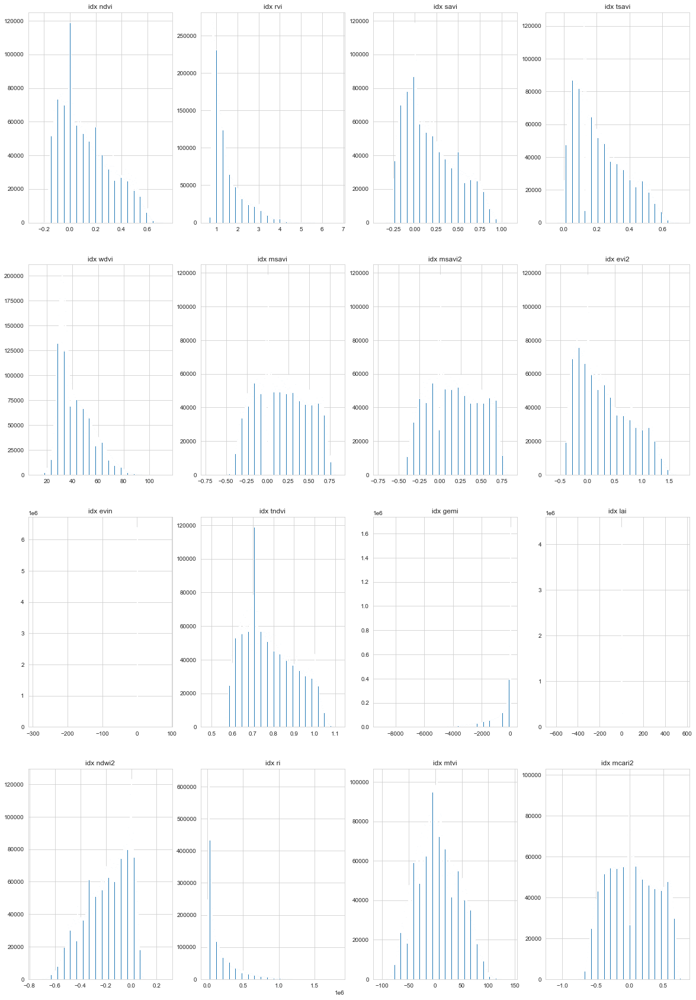

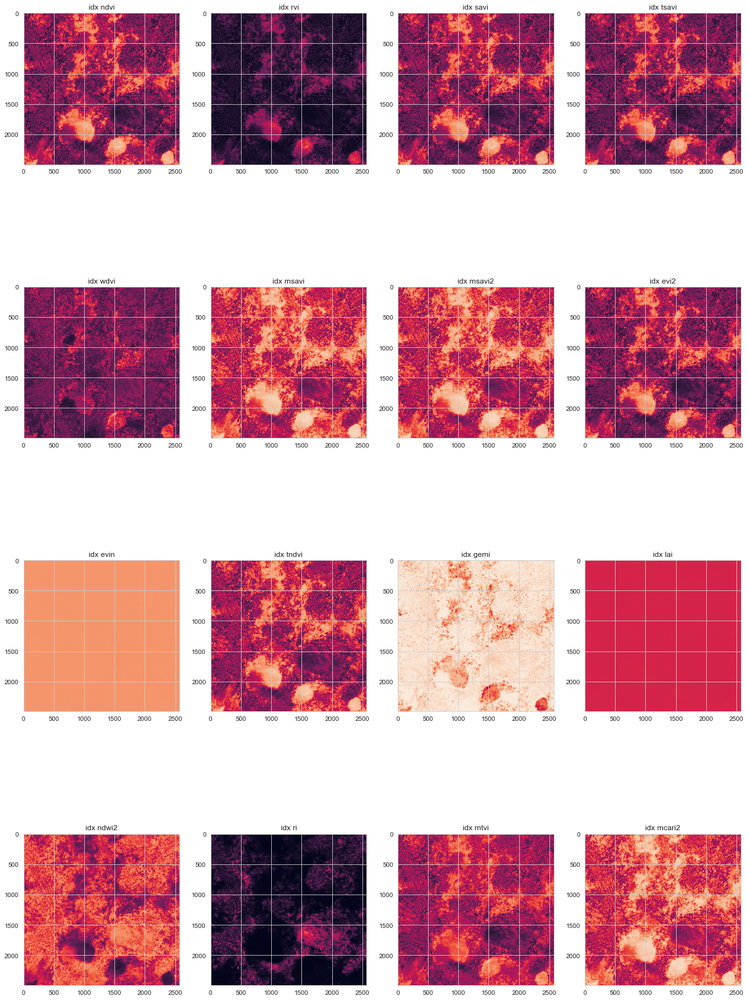

In [153]:
#Compute indexes
# can i use astype(np.float32)
# can i use R_mask_corr? I dont think so
# cvan i use int8? 

R=S_mask[2].astype(np.double)
G=S_mask[1].astype(np.double)
B=S_mask[0].astype(np.double)
RedW=S_mask[3].astype(np.double)
RedEdge=S_mask[4].astype(np.double)
NIR=S_mask[5].astype(np.double)

#Compute some Indexes       
ndvi=spix.NDVI(R,NIR) 
rvi=spix.RVI(R,NIR)
savi=spix.SAVI(R,NIR,L=0.5)
tsavi=spix.TSAVI(R,NIR)
wdvi=spix.WDVI(R,NIR)
msavi=spix.MSAVI(R,NIR) 
msavi2=spix.MSAVI2(R,NIR)
evi2=spix.EVI2(R,NIR)
evin=spix.EVIN(B,R,NIR)
tndvi=spix.TNDVI(R,NIR)
gemi=spix.GEMI(R,NIR)
lai=spix.LAI(B,R,NIR) 
ndwi2=spix.NDWI2(G,NIR)
ri=spix.SoilRI(G,R)
mtvi=spix.MTVI(G,R,NIR)
mcari=spix.MCARI(G,R,RedEdge,NIR)
mcari2=spix.MCARI2(G,R,NIR)
ndre=spix.NDRE(RedEdge,NIR)
mrendvi=spix.MRENDVI(B,RedEdge,NIR)

## stack indexes and plot it to check domain

## inserire un dizionario
IndexArray=np.dstack((ndvi,rvi,savi,tsavi,wdvi,msavi,msavi2,evi2,evin,tndvi,gemi,lai,ndwi2,ri,mtvi,mcari2))
Idx_header= ['ndvi','rvi','savi','tsavi','wdvi','msavi','msavi2','evi2','evin','tndvi','gemi','lai','ndwi2','ri','mtvi','mcari2']

## comment or de-comment for plotting or saving time during debugging

plots_per_row=4
fig, axs = plt.subplots(math.ceil(IndexArray.shape[2]/plots_per_row),plots_per_row,figsize=(20,30))
fig2, axs2 = plt.subplots(math.ceil(IndexArray.shape[2]/plots_per_row),plots_per_row,figsize=(20,30))
i,j=0,0
for k in range(IndexArray.shape[2]):
    if np.isnan(np.sum(IndexArray[:,:,k].reshape(-1,1))):
        print(colored('There are some nan in','blue'),k)
    elif np.isinf(np.sum(IndexArray[:,:,k].reshape(-1,1))):
        print(colored('There are some inf in','blue'),k)
    else:
        print(colored('There arent nan or inf in','blue'),k)
        axs[i][j].hist(IndexArray[:,:,k].reshape(-1,1), bins=200)
        axs[i][j].set_title('idx '+str(Idx_header[k]))
        axs2[i][j].imshow(IndexArray[:,:,k])
        axs2[i][j].set_title('idx '+str(Idx_header[k]))
        j+=1
        if j%plots_per_row==0:
            i+=1
            j=0
plt.show()
plt.show()


del plots_per_row
del fig 
del axs 
del fig2 
del axs2


del IndexArray
del Idx_header

## Identify the erroneus indx and Stack single index maps to generate a nd array

chose the index map that seems to give more information

In [154]:
IndexArray=np.dstack((ndvi,rvi,savi,tsavi,wdvi,msavi,msavi2,evi2,tndvi,gemi,ndwi2,ri,mtvi,mcari2))
Idx_header= ['NDVI','RVI','SAVI','TSAVI','WDVI','MSAVI','MSAVI2','EVI2','TNDVI','GEMI','NDWI2','RI','MTVI','MCARI2']

#transpose the order to be coherent with S_mask
print(IndexArray.shape)
print(S_mask.shape)
IndexArray=np.transpose(IndexArray,(2,0,1))
print(IndexArray.shape)


#Compute some Indexes   
del R
del G
del B
del RedW
del RedEdge
del NIR
del ndvi 
del rvi
del savi
del tsavi
del wdvi
del msavi 
del msavi2
del evi2
del evin
del tndvi
del gemi
del lai
del ndwi2
del ri
del mtvi
del mcari
del mcari2
del ndre
del mrendvi

(2494, 2572, 14)
(6, 2494, 2572)
(14, 2494, 2572)


## Stack six bands images with index maps

In [155]:
multispecralIm=np.append(S_mask,IndexArray,0) 
# multispecralIm=np.append(S_mask_corr,IndexArray,0)
print(multispecralIm.shape)

(20, 2494, 2572)


## Sclae S_mask between 0 and 1 (normalization)

In [156]:
all_header= ['Blue','Green','Red','Red-W','Red-Edge','NIR','NDVI','RVI','SAVI','TSAVI','WDVI','MSAVI','MSAVI2','EVI2','TNDVI','GEMI','NDWI2','RI','MTVI','MCARI2']

bands,rows,cols=multispecralIm.shape
resized_scaled_multispecralIm=np.ones(shape=(1,S_mask.shape[1],S_mask.shape[2]),dtype=np.double)
for j in range(bands):
    multispecralIm_matrix=multispecralIm[j].reshape(-1,1)
    scaled = preprocessing.MinMaxScaler()  #rescaling data between 0 and 1
    scaled_multispecralIm = scaled.fit_transform(multispecralIm_matrix)
    print(colored(' Rescaled ','blue'),all_header[j], colored(' data values to min and max: ','blue'), scaled_multispecralIm.min(),scaled_multispecralIm.max(),colored(' of band number ','blue'),j)
    #give the value to the first band (index 0)
    if j==0:
        resized_scaled_multispecralIm=scaled_multispecralIm.reshape(1, rows, cols)
    else:
        resized_scaled_multispecralIm=np.append(resized_scaled_multispecralIm,scaled_multispecralIm.reshape(1, rows, cols),axis=0)
    
#     ## comment or de-comment for plotting or saving time during debugging
    
#     ## visualization parameter
#     %matplotlib inline
#     rcParams['figure.figsize']=20,4
#     sb.set_style('whitegrid')
#     fig=plt.figure()
#     gs=gridspec.GridSpec(1,2)# nrows, ncols

#     ax1 = plt.subplot(gs[0,0])
#     #         ax1.plot(multispecralImk_matrix, 'b')
#     #         ax1.hist(S_array, bins=40, color='blue')
#     ax1.hist(multispecralIm_matrix, bins=200, color='blue')
#     ax1.set_title('Original')

#     ax2 = plt.subplot(gs[0,1])
#     #         ax2.plot(scaled_multispecralIm, 'r')
#     ax2.hist(scaled_multispecralIm, bins=200, color='red')
#     ax2.set_title('Rescaled between 0 and 1')

#     plt.show('Block')
    
    print(resized_scaled_multispecralIm.shape)

# S_stack=resized_scaled_multispecralIm
del scaled_multispecralIm
del multispecralIm_matrix
del scaled
del all_header


 Rescaled  Blue  data values to min and max:  0.0 1.0  of band number  0
(1, 2494, 2572)
 Rescaled  Green  data values to min and max:  0.0 1.0  of band number  1
(2, 2494, 2572)
 Rescaled  Red  data values to min and max:  0.0 1.0  of band number  2
(3, 2494, 2572)
 Rescaled  Red-W  data values to min and max:  0.0 1.0  of band number  3
(4, 2494, 2572)
 Rescaled  Red-Edge  data values to min and max:  0.0 1.0  of band number  4
(5, 2494, 2572)
 Rescaled  NIR  data values to min and max:  0.0 0.9999999999999999  of band number  5
(6, 2494, 2572)
 Rescaled  NDVI  data values to min and max:  0.0 1.0  of band number  6
(7, 2494, 2572)
 Rescaled  RVI  data values to min and max:  0.0 0.9999999999999999  of band number  7
(8, 2494, 2572)
 Rescaled  SAVI  data values to min and max:  0.0 1.0  of band number  8
(9, 2494, 2572)
 Rescaled  TSAVI  data values to min and max:  0.0 1.0  of band number  9
(10, 2494, 2572)
 Rescaled  WDVI  data values to min and max:  0.0 1.0  of band number  10
(

# 5 - Load DSMminusDTM
## Generate elevation mask for threes segmentation and add elevation Mask that is already normalized
The dsm generated in metashape has a different pixel resolution with respect to the orthoimage, therefore in order to stack all the bands togheter is required a reprojection process

In [157]:
#The threes are extracted using a dsm, therefore we import the dsm, we generate a mask and the we use a mask to provide a value to the threes

#import DTM minus DSM
elevation_file=r'../Data/DSM/20200226T071450/20200226T071450_DSMminDTM_0_10mROI.tif'
elevation_raster_import = rasterio.open(elevation_file)

#crop dsm data with ROI
elevation_data_mask, out_transform_dsm = rasterio.mask.mask(elevation_raster_import,geomSA,crop=True, all_touched=True) #, nodata=1) #is an nd ARRAY OBJECT
print(colored(' Masked data info: ','blue'), elevation_data_mask.shape,elevation_data_mask.dtype, elevation_data_mask.ndim,elevation_data_mask.size, elevation_data_mask.itemsize)

# binarize the dsmmindtm
elev_mask_bin=np.where(elevation_data_mask<0.1, 1, 0)
print(elev_mask_bin.shape)

# Stack also the dsm to the multiband data 
all_header= ['Blue','Green','Red','Red-W','Red-Edge','NIR','NDVI','RVI','SAVI','TSAVI','WDVI','MSAVI','MSAVI2','EVI2','TNDVI','GEMI','NDWI2','RI','MTVI','MCARI2','elevation']
S_stack=np.append(resized_scaled_multispecralIm,elev_mask_bin,0)
print(S_stack.shape)

del resized_scaled_multispecralIm
del elevation_raster_import
del elevation_data_mask
del elev_mask_bin

 Masked data info:  (1, 2501, 2579) float32 3 6450079 4
(1, 2494, 2572)
(21, 2494, 2572)


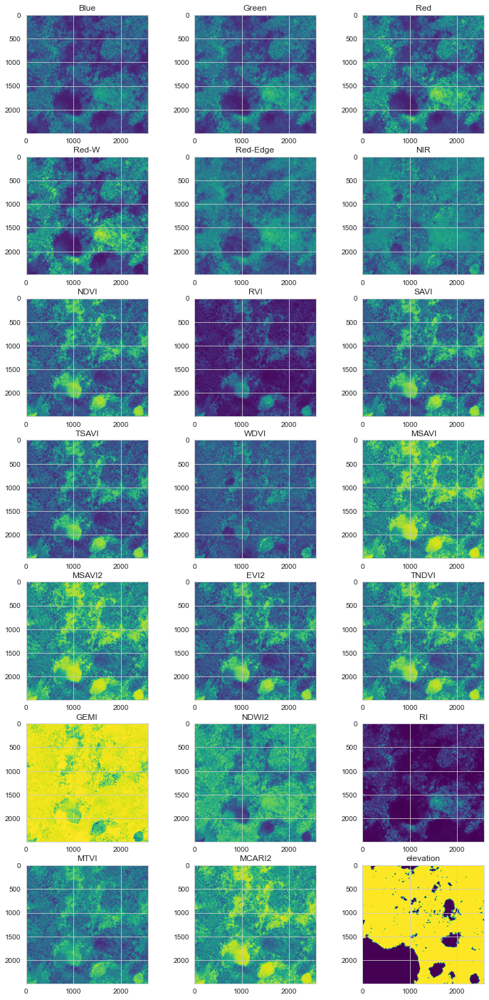

In [160]:
#print final bands

plots_per_row=3
fig, axs = plt.subplots(math.ceil(S_stack.shape[0]/plots_per_row),plots_per_row,figsize=(12,25))
i,j=0,0
for k in range(S_stack.shape[0]):
# for k in range(7):
    axs[i][j].imshow(S_stack[k,:,:],cmap='viridis')
    axs[i][j].set_title(str(all_header[k]))
    j+=1
    if j%plots_per_row==0:
        i+=1
        j=0
# plt.show() 

# del fig
# del axs

Rename the multiband stacked image and change shape following scikit-learn convention

In [162]:
S_stack=np.transpose(S_stack,(1,2,0))
print(colored('ATTENTION: Re-order dimension to follow scikit-learn convention. New shape (nrows,ncols,nbands): ','red'), S_stack.shape,'\n')


ATTENTION: Re-order dimension to follow scikit-learn convention. New shape (nrows,ncols,nbands):  (2494, 2572, 21) 



# Plot Band score correlation with pairplot (is not usefull)

In [ ]:
reshaped_S_stack=S_stack.reshape(-1,S_stack.shape[2])
# df = pd.DataFrame(reshaped_S_stack, columns = all_header)
# sb.pairplot(df[all_header])
#lets simplefy becouse its too heavy
df = pd.DataFrame(reshaped_S_stack[:,:8], columns = all_header[:8])
sb.pairplot(df[all_header[:8]])

# 4 - Thresholdings

The first classification method is the thresholding, used to extract for example, baresoil or vegetation in specific indeces maps (NDVI, SOIL:RI, etc)

In [ ]:
#Setup figure

#DA AGGIUSTARE LA SCALA

out= widgets.Output()

#Update plot function

def update(idx):
    global h
    with out:
        clear_output()
        if imgval.value == 'Blue':
            imddsp=0
        elif imgval.value=='Green':
            imddsp=1
        elif imgval.value=='Red':
            imddsp=2
        elif imgval.value=='Red-w':
            imddsp=3
        elif imgval.value=='Red-Edge':
            imddsp=4
        elif imgval.value=='NIR':
            imddsp=5
        elif imgval.value=='NDVI':
            imddsp=6
        elif imgval.value=='TNDVI':
            imddsp=7
        elif imgval.value=='GEMI':
            imddsp=8
        elif imgval.value=='LAI':
            imddsp=9
        elif imgval.value=='NDWI2':
            imddsp=10
        else:
            imddsp=11

       
        fig, ax=plt.subplots(figsize=(10,10))
        h=ax.imshow(S_stack[:,:,imddsp], vmin=0, vmax=1, cmap= 'terrain')
        h.set_data(np.ma.masked_less_equal(S_stack[:,:,imddsp],slider.value))
        fig.canvas.flush_events()
        fig.canvas.draw()
        plt.show()
   
slider=widgets.FloatSlider(value=0, min=0, max=1, orientation='vertical',description='THOLD', step= 0.1 ) #floatslider
imgval=widgets.RadioButtons(options=['Blue','Green','Red','Red-w','Red-Edge','NIR','NDVI','TNDVI','GEMI','LAI','NDWI2','Soil:RI'], descriptio='Select map:')
   
   # ['dsm','Blue','Green','Red','Red-w','Red-Edge','NIR','NDVI','NDTI','NDWI2','LAI','Soil', 'last'], descriptio='Select map:')
   
    
widget_out=widgets.interactive(update,idx=slider)
widget2=widgets.interactive(update,idx=imgval)
    
widget_out = widgets.HBox(children=(imgval,slider,out))
display(widget_out)

In [ ]:
#PCA
from sklearn.decomposition import PCA
from sklearn import metrics

X=S_stack.reshape(-1,S_stack.shape[2])
pca = PCA(n_components=20)
pca.fit(X)
print("Relative variance in principal components:", pca.explained_variance_ratio_)

#looped

# for i in range(0,S_stack.shape[2]):
#     X=S_stack[:,:,0:i+1].reshape((-1,S_stack[:,:,0:i+1].shape[2]))

## Garbage handling

In [47]:
import gc
# del S_import
# del S_narray
# del S_mask_corr
# del multispecralIm
# del scaled_multispecralIm
# del multispecralIm_matrix
# del resized_scaled_multispecralIm
# del new_elev_mask_bin
# del fig
# del axs
# del resized_scaled_multispecralIm
# del new_elev_mask_bin
# del elevation_folder
# del elevation_fn
# del elevation_raster_import
# del elevation_data_mask
# del out_transform_dsm
# del elev_mask_bin
# del plt
gc.collect()

116

# 5 - K-means clustering

__K-means__ (MacQueen,19677) is one of the simplest unsupervised learning algorithms that solve the well known clustering problem. The procedure follows a simple and easy way to classify a given data set through a certain number of clusters (assume k clusters) fixed position. The main idea is to define k centroids, one for each cluster. These centroids should be placed in a cunning way because of different locaton causes different results. The better choice is to place them as musch as possible far away from each other. The next step is to take each point belongin to a given data set and associate t to the nearest centroid. When no point is pending, the first step is complited and the early groupage is done. AT this point we need to re-calcoleate k new centroids as barycenters of the clusters resulting from the previous step. After we have these k new centroids, a new binding has to be done between the same data set points and the nearest new centroid. A loop has been generated. As a result of this loop we may notice that the k centroids change thir location step by step until no more changes are done. 

<div class="alert alert-block alert-info">
<b>Tip:</b> More information on K-means can be found:</div> 


[click me](https://en.wikipedia.org/wiki/K-means_clustering)

The algorithm is composed by the following steps:

    1. Place K points into athe spaces represented by objects that are being clustered. These points represent initial group centroids.
    2. Assign each object to the group that has the closes centroid.
    3. When all objecys have been assigned, recalculate the positions of K centroids.
    4. Repeas Step 2 and 3 until the centroids no longer move. This produces a separation of the objecys into groups from which the metric to be minimized can be calculated.

<a title="Chire, CC BY-SA 4.0 &lt;https://creativecommons.org/licenses/by-sa/4.0&gt;, via Wikimedia Commons" href="https://commons.wikimedia.org/wiki/File:K-means_convergence.gif"><img width="256" alt="K-means convergence" src="https://upload.wikimedia.org/wikipedia/commons/thumb/e/ea/K-means_convergence.gif/256px-K-means_convergence.gif"></a>

In particular the K-means implementation of the sklearn python library is used (more info [here](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html)). The algorithm can be performed in single images or in multiple stacked images in order to take into account the multiband capability of the Slantrange camera sensor. The parameter to select are:

    1. The number of clusters (Classes);
    2. The type of k-means algorithm;
    3. The number of images to use in combination.
 In this implementation the unsupervised learning is performed adding every image to the previuous ones, till the end of the stack.
 
 
 REMEMBER: S_stack is f(S_images) which are modified by the dsm (three identification)

## Dimensionaity reduction
The first question that you should ask is whether or not you need to apply a dimensionality reduction technique. If you have very few features compared to the number of samples, you probably do not require to reduce the number of features. On the other hand, if the number of features is larger than the number of samples, then you will be dealing with the “curse of dimensionality”, and your k-means algorithm will not produce good results. In this case, you do want to reduce the number of features that you have. There are several techniques you could use for dimensionality reduction. For example, you could use feature selection, where you select the features that you think are the most relevant for the challenge at hand. Another approach is to use Principal Component Analysis (PCA), where you transform your data into a new dimensional space, where all the components are orthogonal to each other. Also, the components are sorted from the ones that describe the highest to lowest variance in the data. You would select a subset of the principal components as the features in your model, and capture a majority of your variance. Note that the k-mean clustering algorithm is typically slow and depends in the number of data points and features in your data set. In summary, it wouldn’t hurt to apply PCA before you apply a k-means algorithm.

In [ ]:
#PCA
from sklearn.decomposition import PCA
from sklearn import metrics
from sklearn.preprocessing import StandardScaler
X=S_stack.reshape(-1,S_stack.shape[2])
#total dataset information
print("Total dataset size:")
print("n_samples: %d" % X.shape[0])
print("n_features: %d" % X.shape[1])

#scale the data
scaler=StandardScaler()
scaler.fit(X)
# print(scaler.fit(X))
scaled_data=scaler.transform(X)
# print(scaled_data)
pca = PCA(n_components=6)
pca.fit(X)
print("Relative variance in principal components:", pca.explained_variance_ratio_)


X_reduction=pca.transform(X)
#total dataset information
print("\n reducted dataset size:")
print("n_samples: %d" % X_reduction.shape[0])
print("n_features: %d" % X_reduction.shape[1])


X_reduction.reshape(S_stack.shape[0],S_stack.shape[1],pca.n_components_)
print(X_reduction.shape)


## RUN KMEAN ALGORITHM ON REDUCTED SAMPLES

run kmean on reducted dataset with 8 clusters (arbitrary selected) and the features extracted from PRINCIPAL COMPONENT ANALISYS

In [ ]:
nclusters=8

#apply k_mean
k_means = KMeans(n_clusters=nclusters, init='k-means++', max_iter=100, n_init=20,verbose=False).fit(X_reduction) #,n_jobs=1
print(colored('The K-means model fitted in this scenario is: \n', 'blue'), k_means, '\n')
print(colored('cluster center','blue'),k_means.cluster_centers_)
print(colored('center shape','blue'),k_means.cluster_centers_.shape)
print(colored('labels','blue'),k_means.labels_)
print(colored('inertia','blue'),k_means.inertia_)
print(colored('number of iteration','blue'),k_means.n_iter_)
print(colored('number of features','blue'),k_means.n_features_in_)

X_cluster=k_means.labels_
X_clustered=X_cluster.reshape([rows,cols])
print(colored('Outputs saved in variable X_clustered with shape: ', 'blue'),X_clustered.shape,'\n')

%matplotlib inline
import pylab
pylab.figure()
for i in range(k_means.cluster_centers_.shape[0]):
    pylab.plot(k_means.cluster_centers_[i])
pylab.show
pylab.title('Spectral Classes from K-Means Clustering')
pylab.xlabel('Bands')
pylab.ylabel('digital number')


fig=plt.figure(figsize=(15,25))

plt.imshow(X_clustered, cmap='Dark2')
plt.title(str(nclusters)+ ' Clusters K-means | Using '+str(bands)+ ' 20 images')
plt.show

# The three problem to address with kmeans algoritm:
1. Selecting the right number of clusters. 
    
    The solution is to apply the elbow method

2. Selecting the number of max iteration to minimize the WSS and reach convergence
    
    The solution could be to set a tolerance or to set a max number of iteration

3. How to address the variability of the kmeans connected to the intial position of the centroids?
    
    Solution is to run the same kmeans n-times changing the intial centroid position and select the best clustering which is the minor WSS

## 1st problem: Elbow method

Now we have obtained the clustered images. But the question is how we mwasure similarity between objects? The similarity could be defined as the opposite of the distance expressed as the squared Euclidean distance between two points x and y in the m-dimensional space. Based on this Euclidean distance metric, we can describe the k-means algorithm as a simple classic optimization problem, an iterative approach of minimizinf the within cluster Sum of Squared Errors (SSE), which is also referred as __cluster Inertia__.

It is important to remember that a drawback of k-means is that we have to specify the number of clusters, k, before we know what the optimal k is. The number of clusters to chose may not always be so obvious in real-world application, especially if we are working with higher dimensional dataset that cannot be visualized. 

To solve this issue, we can use the __Elbow Method__, a useful graphical tool to estimate the optimal number of clusters k for a given task. Intuitively, we can say that, if k increases, the within-cluster SSE (_distortion_) will decrease. This is because the sample will be closer to centroids they are assigned to. The idea behind the elbow method is to identify the value of k where the distortion begins to decrease most rapidly, which will become clearer if we plot the distortion for different values of k.

The following algorithm will provide the elbow plot and will allows to select the number of optimal clusters to re-run the k-means algorithm.



number of initial cluster used: 15
21 products has been used for k-means clustering. Original shape:(2494, 2572, 21). Product has been reshaped to: (6414568, 21)
Kmeans using nclusters =  1
Initialization complete
Iteration 0, inertia 8984081.694258425.
Iteration 1, inertia 4619002.233171981.
Converged at iteration 1: strict convergence.
Kmeans using nclusters =  2
Initialization complete
Iteration 0, inertia 4207504.428497004
Iteration 1, inertia 2668424.052837689
Iteration 2, inertia 2539516.887796949
Iteration 3, inertia 2491519.9045223645
Iteration 4, inertia 2472902.5921615763
Iteration 5, inertia 2465496.4191235444
Iteration 6, inertia 2462496.9650920318
Iteration 7, inertia 2461259.696255803
Iteration 8, inertia 2460744.255928556
Iteration 9, inertia 2460529.3471314493
Iteration 10, inertia 2460440.0648479415
Iteration 11, inertia 2460402.483043325
Converged at iteration 11: center shift 3.08794293724423e-06 within tolerance 3.4289524609400486e-06.
Kmeans using nclusters =  3
In

,Clusters,Inertia
0,1,4.619002e+06
1,2,2.460387e+06
2,3,1.827867e+06
3,4,1.371491e+06
4,5,9.268551e+05
5,6,7.823674e+05
6,7,7.028623e+05
7,8,5.389301e+05
8,9,4.955216e+05
9,10,4.348659e+05


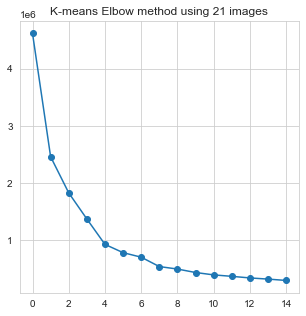

In [163]:
import sklearn.metrics as metrics
from sklearn.metrics.pairwise import paired_distances

#First select the number of cluster max and use all the bands in a multi-band approach
nclusters=15
print(colored('number of initial cluster used:','blue'),nclusters)
rows,cols,bands=S_stack.shape

#prepare data:
X=S_stack.reshape((-1,S_stack.shape[2]))
print(S_stack.shape[2], colored(' products has been used for k-means clustering. Original shape:', 'blue'),S_stack.shape, colored('. Product has been reshaped to: ','blue'),X.shape, sep='')

distortions=[]
for i in range(1,nclusters+1): #08/07/2021 ho aggiunto il +1...verificare se ha senso
    print(colored('Kmeans using nclusters = ','blue'),i)
    km=KMeans(n_clusters=i, init='k-means++', max_iter=20, n_init=1,verbose=True).fit(X)
    distortions.append(km.inertia_) #wss score
 
fig = plt.figure(figsize=(5,5))
plt.plot(range(0,nclusters),distortions, marker='o')
plt.title('K-means Elbow method using ' +str(S_stack.shape[2])+ ' images')
plt.grid(True)
init_ncluster=nclusters   

dataframe = pd.DataFrame({'Clusters':  range(1,nclusters+1), 'Inertia': distortions})
dataframe

# Kmeans algorithm execution
after choosing the number of cluster with Elbow method I select the correct cluster number and i run the kmeans on the samples 

<div class="alert alert-block alert-warning">
<b>Changes:</b> insert the number of clusters in variable <b>nclusters</b>.   
</div>

The K-means model fitted in this scenario is: 
 KMeans(max_iter=100, n_init=20, verbose=False) 

cluster center [[ 1.92099539e-01  2.48792628e-01  2.72052235e-01  2.53716876e-01
   3.53781843e-01  4.48326007e-01  5.08005089e-01  1.75684442e-01
   5.09090645e-01  4.65612793e-01  3.75768636e-01  7.05537134e-01
   7.05537143e-01  5.10164151e-01  6.02523842e-01  9.29720847e-01
   4.48930350e-01  3.65378096e-02  5.43056942e-01  7.40658774e-01
   1.00000000e+00]
 [ 2.22267485e-01  2.36905283e-01  2.74935960e-01  2.86261939e-01
   2.48687292e-01  2.96200054e-01  3.62394465e-01  1.04611095e-01
   3.63078684e-01  3.21898525e-01  2.15132146e-01  5.68093807e-01
   5.68093813e-01  3.63754797e-01  4.60450898e-01  9.91046032e-01
   5.66192110e-01  3.38613510e-02  4.34691250e-01  6.10088661e-01
   1.00000000e+00]
 [ 4.87240261e-01  5.58587933e-01  6.61373395e-01  6.99807159e-01
   5.31574938e-01  4.87794546e-01  1.55698908e-01  3.63411743e-02
   1.55799099e-01  1.37413720e-01  2.32715696e-01  2.97846

<function matplotlib.pyplot.show(close=None, block=None)>

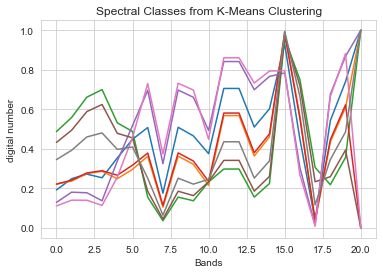

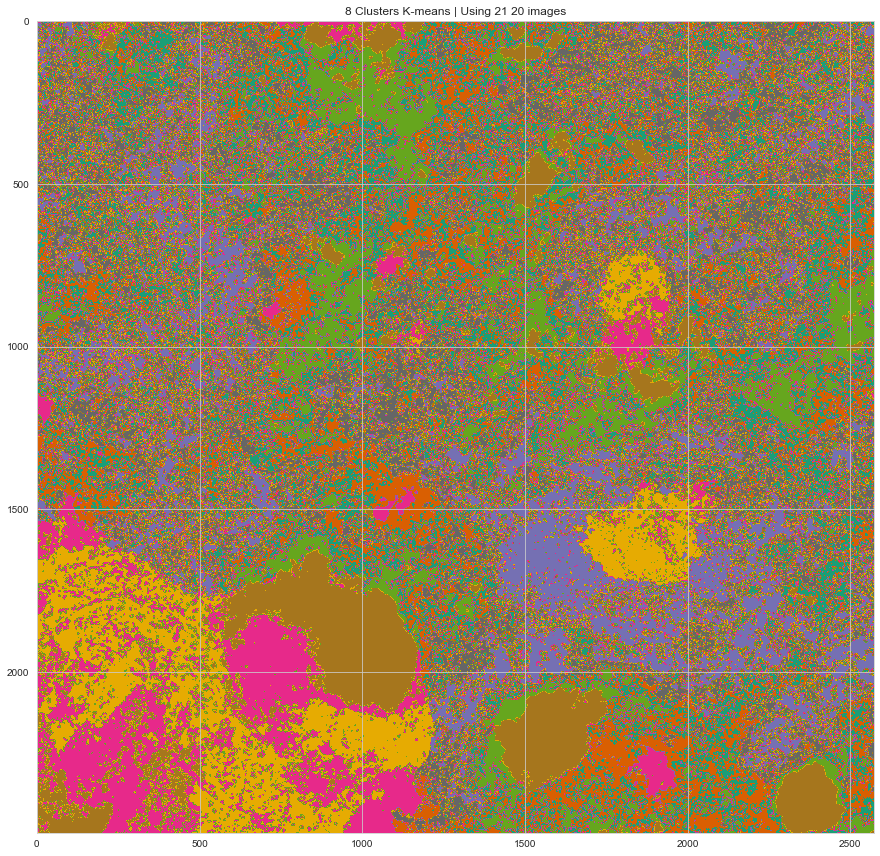

In [166]:
nclusters=8

#apply k_mean
k_means = KMeans(n_clusters=nclusters, init='k-means++', max_iter=100, n_init=20,verbose=False).fit(X) #,n_jobs=1
print(colored('The K-means model fitted in this scenario is: \n', 'blue'), k_means, '\n')
print(colored('cluster center','blue'),k_means.cluster_centers_)
print(colored('center shape','blue'),k_means.cluster_centers_.shape)
print(colored('labels','blue'),k_means.labels_)
print(colored('inertia','blue'),k_means.inertia_)
print(colored('number of iteration','blue'),k_means.n_iter_)
print(colored('number of features','blue'),k_means.n_features_in_)

X_cluster=k_means.labels_
X_clustered=X_cluster.reshape([rows,cols])
print(colored('Outputs saved in variable X_clustered with shape: ', 'blue'),X_clustered.shape,'\n')

%matplotlib inline
import pylab
pylab.figure()
for i in range(k_means.cluster_centers_.shape[0]):
    pylab.plot(k_means.cluster_centers_[i])
pylab.show
pylab.title('Spectral Classes from K-Means Clustering')
pylab.xlabel('Bands')
pylab.ylabel('digital number')


fig=plt.figure(figsize=(15,25))

plt.imshow(X_clustered, cmap='Dark2')
plt.title(str(nclusters)+ ' Clusters K-means | Using '+str(bands)+ ' 20 images')
plt.show

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Text(0.5, 1.0, 'K-means clustering')

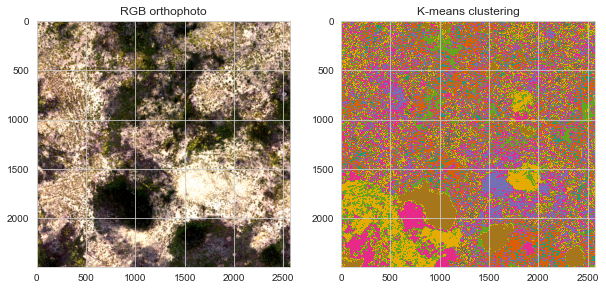

In [168]:
#Reshape image to original dimension to allow visualization
#S_stack= S_stack.reshape(rows,cols, bands)

#Plot one of the cropped images
blue=S_stack[:,:,0]
green=S_stack[:,:,1]
red=S_stack[:,:,2]
rgb=np.dstack((red,green,blue))
val1,val2 = np.percentile(rgb, (2.5,97.5))
rgb_exposure = exposure.rescale_intensity(rgb, in_range=(val1,val2), out_range=(0,1.2))
# rgb_exposure = exposure.rescale_intensity(rgb, in_range=(0,1), out_range=(0,0.4))


fig, axes=plt.subplots(ncols=2,nrows=1,figsize=(10,10))
ax1,ax2 = axes.flatten()
ax1.imshow(rgb_exposure)
ax1.set_title('RGB orthophoto')
ax2.imshow(X_clustered,cmap='Dark2')
ax2.set_title('K-means clustering')
# # show(rgb,ax=ax1, cmap='gray', title= "Original")
# show(X_clustered, ax=ax2, title='K-means',cmap='Dark2')

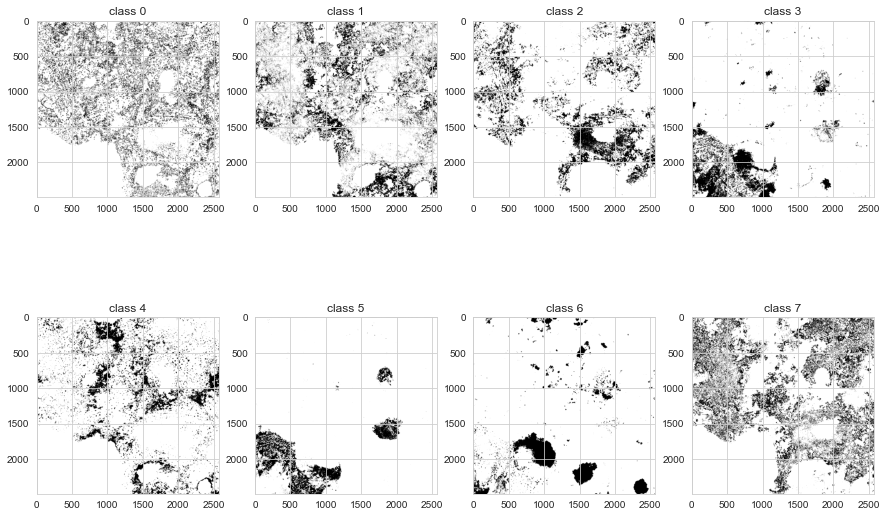

In [170]:
n_cls=nclusters
List_img_cluster=[]

for i in range(nclusters):

    Img_cluster = n_cls*np.ones(shape=(rows,cols),dtype=np.int)
    Img_cluster=X_clustered.copy() 
    Img_cluster[Img_cluster!=i]=100 # value different from any class
    Img_cluster[Img_cluster==i]=0 #my class
    Img_cluster[Img_cluster==100]=1
    List_img_cluster.append(Img_cluster)
            
plots_per_row=4
fig, axs = plt.subplots(math.ceil(len(List_img_cluster)/plots_per_row),plots_per_row,figsize=(15,10))
i,j=0,0
for k in range(len(List_img_cluster)):
    axs[i][j].imshow(List_img_cluster[k], cmap='gray')
    axs[i][j].set_title('class '+str(k))
    j+=1
    if j%plots_per_row==0:
        i+=1
        j=0
plt.show()     

The previous visualization help us to give a name to each label by visually associate the band to the class. Our Class has been defined by the experts of entomology and are: Threes,

<img src="Tabella_classi2.png">

Let's compute the percentege of LC for the other two ROI

In [172]:
# Store the results
import csv

# exporting a list variable into the csv file
header_variable = ['Class_0', 'Class_1', 'Class_2', 'Class_3','Class_4','Class_5', 'Class_6']
# header_variable = ['Threes', 'Herbaceous_Plants', 'Baresoil', 'Herbaceous_Plants_2','Stones','Woody_plants', 'Class_6', 'Dry_Herbaceous_Plants']

row_pix=[]
perc_pix=[]

for j in range(nclusters):#0-7
    n_pix= X_clustered[X_clustered==j].size    
    print(colored('n of pixel for Class ' + str(j)+ ' is:','blue'),n_pix)
    row_pix.append(n_pix)

summ=sum(row_pix)
    
for j in range(nclusters):#0-7
    perc_pix.append((row_pix[j]*100)/summ)

tot_perc=sum(perc_pix)


dataframe = pd.DataFrame({'Clusters':  range(1,nclusters+1), 'number of pixel': row_pix, '% of pixels': perc_pix})
print('Land Cover Unsupervised Classification for training data \n')
display(dataframe)


n of pixel for Class 0 is: 1050856
n of pixel for Class 1 is: 1065518
n of pixel for Class 2 is: 844253
n of pixel for Class 3 is: 522854
n of pixel for Class 4 is: 763039
n of pixel for Class 5 is: 403014
n of pixel for Class 6 is: 448568
n of pixel for Class 7 is: 1316466
Land Cover Unsupervised Classification for training data 



,Clusters,number of pixel,% of pixels
0,1,1050856,16.382335
1,2,1065518,16.610908
2,3,844253,13.161494
3,4,522854,8.151040
4,5,763039,11.895407
5,6,403014,6.282793
6,7,448568,6.992957
7,8,1316466,20.523066


# 6 - Supervised Classification

The sklearn python library provides different classification algorithms based on Machine learning and Neural Networking. In this work the Random Forest and the Support Vector Machine has been used. Before to train the model we need to prepare the data. In this pixel-based approach, the reference data are provided by the unsupervised classification.

### 6.1 a) Training
As with other classifiers, DecisionTreeClassifier takes as input two arrays: an array X, sparse or dense, of shape (n_samples, n_features) holding the training samples, and an array Y of integer values, shape (n_samples,), holding the class labels for the training samples. After being fitted, the model can then be used to predict the class of samples.

Prepare the dataset: a certain percentage of image pixel provided by the unsupervised classification are now used for train a model

In [ ]:
from sklearn.model_selection import train_test_split
# the data selected are X_reduction
# the unsupervised labels selected are X_cluster
X=X_reduction
y=X_cluster
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

Train the selected model (DecisionTreeClassifier) fitting the training sample (20% of total pixles) to predict the corresponding correct class (y_train)

In [ ]:
# fit model
from sklearn import tree
clf = tree.DecisionTreeClassifier()
clf = clf.fit(X_train,y_train) 
clf.score(X_test, y_test)

show the decision tree branches

In [ ]:
bands=['Blue','Green','Red','Red-w','Red-Edge','NIR']
plt.figure(figsize=(25,30))
tree.plot_tree(clf, max_depth=3, feature_names=bands, fontsize=15)
plt.show()

Validate the trained model on the testing sample

In [ ]:
y_predicted = clf.predict(X_test)#predicting using best estimator X[test] is the data to be classified and the classification are stored on label vector

print(
    f"Classification report for classifier {clf}:\n"
    f"{metrics.classification_report(y_test, y_predicted)}\n"
)

disp = metrics.ConfusionMatrixDisplay.from_predictions(y_test, y_predicted)
disp.figure_.suptitle("Confusion Matrix")
print(f"Confusion matrix:\n{disp.confusion_matrix}")

plt.show()

apply the model to the entire dataset

In [ ]:
start=perf_counter()
print(colored('Classyfing image using model RF...','blue'))
y_supervised = clf.predict(X)#predicting using best estimator X[test] is the data to be classified and the classification are stored on label vector
end=perf_counter()
print(colored('Classification completed. Processing Time:','blue'), round (((end-start)),2), 'seconds')


In [ ]:
y_supervised_clustered=y_supervised.reshape([rows,cols])
fig=plt.figure(figsize=(15,25))

plt.imshow(y_supervised_clustered, cmap='Dark2')
plt.title('supervised classification')
plt.show

Random forest

In [ ]:
# Reshape raster to be classified to 2D
from sklearn.ensemble import RandomForestClassifier

from sklearn import tree
RF_clf =RandomForestClassifier(n_estimators=1000,class_weight = 'balanced_subsample', criterion ='gini', random_state=42)
RF_clf=RF_clf.fit(X_train,y_train)

RF_clf.score(X_test, y_test)

y_predicted_RF = RF_clf.predict(X_test)#predicting using best estimator X[test] is the data to be classified and the classification are stored on label vector

print(
    f"Classification report for classifier {clf}:\n"
    f"{metrics.classification_report(y_test, y_predicted_RF)}\n"
)

disp = metrics.ConfusionMatrixDisplay.from_predictions(y_test, y_predicted_RF)
disp.figure_.suptitle("Confusion Matrix")
print(f"Confusion matrix:\n{disp.confusion_matrix}")

plt.show()

start=perf_counter()
print(colored('Classyfing image using model RF...','blue'))
y_supervised_RF = RF_clf.predict(X)#predicting using best estimator X[test] is the data to be classified and the classification are stored on label vector
end=perf_counter()
print(colored('Classification completed. Processing Time:','blue'), round (((end-start)),2), 'seconds')


y_supervised_clustered_RF=y_supervised_RF.reshape([rows,cols])
fig=plt.figure(figsize=(15,25))

plt.imshow(y_supervised_RF_clustered, cmap='Dark2')
plt.title('supervised classification')
plt.show

# 6 - Supervised Classification

The sklearn python library provides different classification algorithms based on Machine learning and Neural Networking. In this work the Random Forest and the Support Vector Machine has been used. Before to train the model we need to prepare the data. In this pixel-based approach, the reference data are provided by the unsupervised classification. Therefore is necessary to:

    1. Select the best clusterized raster from the K-means computation (X_clustered[number]);
    2. Assign the correct class to each label obtained in the unsupervised classification;
    3. Extract a percentage of pixels, equal for each class to be used as training and testing data (for example the 4%) randomly;
    4. Using those data as training for the machine learning model;
    5. Apply the fitted model to the testing data which are the total minus the training.

In [ ]:
# Create a copy to avoid changing original data
n_cls=8
Unsup_clusterized=X_clustered.copy()

#Check size of original pixel values

print(colored('Number of pixels belonigng to cluster 0;','blue'), Unsup_clusterized[Unsup_clusterized==0].size)
print(colored('Number of pixels belonigng to cluster 1;','blue'), Unsup_clusterized[Unsup_clusterized==1].size)
print(colored('Number of pixels belonigng to cluster 2;','blue'), Unsup_clusterized[Unsup_clusterized==2].size)
print(colored('Number of pixels belonigng to cluster 3;','blue'), Unsup_clusterized[Unsup_clusterized==3].size)
print(colored('Number of pixels belonigng to cluster 4;','blue'), Unsup_clusterized[Unsup_clusterized==4].size)
print(colored('Number of pixels belonigng to cluster 5;','blue'), Unsup_clusterized[Unsup_clusterized==5].size)
print(colored('Number of pixels belonigng to cluster 6;','blue'), Unsup_clusterized[Unsup_clusterized==6].size)
print(colored('Number of pixels belonigng to cluster 7;','blue'), Unsup_clusterized[Unsup_clusterized==7].size)
print(colored('Number of pixels belonigng to cluster 8;','blue'), Unsup_clusterized[Unsup_clusterized==8].size)
print(colored('Number of pixels belonigng to cluster 9;','blue'), Unsup_clusterized[Unsup_clusterized==9].size)
print(colored('Number of pixels belonigng to cluster 10;','blue'), Unsup_clusterized[Unsup_clusterized==10].size)
print(colored('Number of pixels with value 11;','blue'), Unsup_clusterized[Unsup_clusterized==11].size)

3. Extract the coordinates of the pixels belonging the urban and non-urban clusters. In addition, we set the percentage of pixels that will be used fot training both classes.

In [ ]:
Class1 = np.argwhere(Unsup_clusterized == 0)
Class2 = np.argwhere(Unsup_clusterized == 1)
Class3 = np.argwhere(Unsup_clusterized == 2)
Class4 = np.argwhere(Unsup_clusterized == 3)
Class5 = np.argwhere(Unsup_clusterized == 4)
Class6 = np.argwhere(Unsup_clusterized == 5)
Class7 = np.argwhere(Unsup_clusterized == 6)
Class8 = np.argwhere(Unsup_clusterized == 7)
Class9 = np.argwhere(Unsup_clusterized == 8)
Class10 = np.argwhere(Unsup_clusterized == 9)
Class11 = np.argwhere(Unsup_clusterized == 10) #extra class to check

print(colored('Example of extracted index for 1 class','blue'),Class1[0])
print(colored('Example of extracted index for 2 class','blue'),Class2[0])
print(colored('Example of extracted index for 3 class','blue'),Class3[0])
print(colored('Example of extracted index for 4 class','blue'),Class4[0])
print(colored('Example of extracted index for 5 class','blue'),Class5[0])
print(colored('Example of extracted index for 6 class','blue'),Class6[0])
print(colored('Example of extracted index for 7 class','blue'),Class7[0])
print(colored('Example of extracted index for 8 class','blue'),Class8[0])
# print(colored('Example of extracted index for 9 class','blue'),Class9[0])
# print(colored('Example of extracted index for 10 class','blue'),Class10[0])
# print(colored('Example of extracted index for 11 class','blue'),Class11[0])

print(colored('Pixel value in array coordinate [0,58] is:','blue'),Unsup_clusterized[0,58])
print(colored('Pixel value in array coordinate [0,0] is:','blue'),Unsup_clusterized[0,0])
print(colored('Pixel value in array coordinate [0,3] is:','blue'),Unsup_clusterized[0,3])
print(colored('Pixel value in array coordinate [0,365] is:','blue'),Unsup_clusterized[0,365])
#Define number of pixels to be used for training by settina a %


Now we are ready to create our training data. To ensure a random behaviour in the selection of pixels that will be used to train the model, we generate the 4% of each class random number ranging from 0 to the length of the given Class. These randomly-generated numbers will be used to select a subset array for each Class and get the Indces of the pixels that will be used to train each class.

In [ ]:
# Define number of pixels to be used for training by setting a %. Must be balanced!

#provare il 30% delle più piccole

perc_class1=int(len(Class1)*0.04)
perc_class2=int(len(Class2)*0.04)
perc_class3=int(len(Class3)*0.04)
perc_class4=int(len(Class4)*0.04)
perc_class5=int(len(Class5)*0.04)
perc_class6=int(len(Class6)*0.04)
perc_class7=int(len(Class7)*0.04)
perc_class8=int(len(Class8)*0.04)
perc_class9=int(len(Class9)*0.04)
perc_class10=int(len(Class10)*0.04)

print(colored('\ NUmber of Class 1 pixels used for training (4%);','blue'), perc_class1)
print(colored('\ NUmber of Class 2 pixels used for training (4%);','blue'), perc_class2)
print(colored('\ NUmber of Class 3 pixels used for training (4%);','blue'), perc_class3)
print(colored('\ NUmber of Class 4 pixels used for training (4%);','blue'), perc_class4)
print(colored('\ NUmber of Class 5 pixels used for training (4%);','blue'), perc_class5)
print(colored('\ NUmber of Class 6 pixels used for training (4%);','blue'), perc_class6)
print(colored('\ NUmber of Class 7 pixels used for training (4%);','blue'), perc_class7)
print(colored('\ NUmber of Class 8 pixels used for training (4%);','blue'), perc_class8)
print(colored('\ NUmber of Class 9 pixels used for training (4%);','blue'), perc_class9)
print(colored('\ NUmber of Class 10 pixels used for training (4%);','blue'), perc_class10)

# Create rundom number by giving a range that span on the number of samples for the given class
Indexes_Class1 = random.sample(range(len(Class1)), perc_class1)
Indexes_Class2 = random.sample(range(len(Class2)), perc_class2)
Indexes_Class3 = random.sample(range(len(Class3)), perc_class3)
Indexes_Class4 = random.sample(range(len(Class4)), perc_class4)
Indexes_Class5 = random.sample(range(len(Class5)), perc_class5)
Indexes_Class6 = random.sample(range(len(Class6)), perc_class6)
Indexes_Class7 = random.sample(range(len(Class7)), perc_class7)
Indexes_Class8 = random.sample(range(len(Class8)), perc_class8)
Indexes_Class9 = random.sample(range(len(Class9)), perc_class9)
Indexes_Class10 = random.sample(range(len(Class10)), perc_class10)

#Extract and create some usefull parameters (REMEMBER NUMBER OF CLASSES!)
rows, cols, bands = S_stack.shape
classes ={'Plants': 0, 'name_class_2': 1, 'name_class_3': 2, 'Grass': 3, 'name_class_5': 4, 'Bare soil': 5, 'Moss': 6, 'name_class_8': 7}#, 'name_class_9': 8, 'name_class_10': 9}
n_classes = len(classes)

#Create new array to store training values for each class
supervised = n_classes*np.ones(shape=(rows,cols),dtype=np.int)


# Using random numbers, get the coordinates of training pixels  and assign them a class

for k in Indexes_Class1:
    supervised[Class1[k][0], Class1[k][1]] = classes['Plants']
for k in Indexes_Class2:
    supervised[Class2[k][0], Class2[k][1]] = classes['name_class_2']
for k in Indexes_Class3:
    supervised[Class3[k][0], Class3[k][1]] = classes['name_class_3']
for k in Indexes_Class4:
    supervised[Class4[k][0], Class4[k][1]] = classes['Grass']
for k in Indexes_Class5:
    supervised[Class5[k][0], Class5[k][1]] = classes['name_class_5']
for k in Indexes_Class6:
    supervised[Class6[k][0], Class6[k][1]] = classes['Bare soil']
for k in Indexes_Class7:
    supervised[Class7[k][0], Class7[k][1]] = classes['Moss']
for k in Indexes_Class8:
    supervised[Class8[k][0], Class8[k][1]] = classes['name_class_8']
#for k in Indexes_Class9:
    #supervised[Class9[k][0], Class9[k][1]] = classes['name_class_9']
#for k in Indexes_Class10:
   # supervised[Class10[k][0], Class10[k][1]] = classes['name_class_10']

# show(supervised,cmap=mpl.colors.ListedColormap(['yellow','yellow','blue','black']))   
#Display new training raster
print(supervised[0])
print(supervised[1])
print(supervised[2514])
# colors=(['red','green','blue','yellow','orange'])#,'cyan','pink','purple','white','black'])#,'blue','yellow','black'])
# imgplot = plt.imshow(supervised,interpolation='nearest',cmap=mpl.colors.ListedColormap(colors))
# plt.colorbar()

fig, (ax1)=plt.subplots(1,1,figsize=(15,15))
im1=ax1.imshow(supervised,interpolation='nearest', cmap=mpl.colors.ListedColormap(['cyan','yellow','orange','red','pink','blue','purple','green','black']))#'red','green','pink','black','white','gray']))
ax1_divider = make_axes_locatable(ax1)
cax1=ax1_divider.append_axes("right", size="2%", pad="1%")
cb1 = colorbar(im1, cax= cax1)


With the train data already generated, the next step consist of reshaping it to 1D to match the input format required by sklearn. In addition, we split the training data in two new datasets: train (pixels to be used to train the model) and test (pixel to be classified)

In [ ]:
# Resahpe raster (numpy array) to 1D

y=supervised.ravel()
y_old=y
print(colored('Original shape of training','blue'), supervised.shape, colored(' Shape of training data after .ravel() is:','blue'), y.shape)

#get array index (in 1D) of training and non training pixels

train= np.flatnonzero(supervised< n_classes) # class1 to class8 which are label 0 to 7
test=np.flatnonzero(supervised==n_classes) # label = 8 are no classified
print(colored('Original shape of control','blue'), train.shape)
print(colored('Original shape of tesing','blue'), test.shape)


In [ ]:
# Reshape raster to be classified to 2D

X= S_stack.reshape(rows*cols,bands)
print(colored('S_stack has been reshaped to:','blue'), X.shape, '\n')

# fit model
from sklearn import tree
clf = tree.DecisionTreeClassifier()
clf = clf.fit(X[train],y[train]) 
#After being fitted, the model can then be used to predict the class of samples:


In [ ]:
# Reshape raster to be classified to 2D
from sklearn.ensemble import RandomForestClassifier
X= S_stack.reshape(rows*cols,bands)
print(colored('S_stack has been reshaped to:','blue'), X.shape, '\n')

# fit model
from sklearn import tree
model_clf =RandomForestClassifier(n_estimators=1000,class_weight = 'balanced_subsample', criterion ='gini', random_state=42)
model_clf=model_clf.fit(X[train],y[train])

#After being fitted, the model can then be used to predict the class of samples:

#  7 multitemporal/multiband Kmeans algorithm execution version 2
To choose how many band are usfull for the kmeans I can apply a multiband approach and run the code aifin always a new band. 
This is not suggested as increase a lot the time effort and dont provide a clear metrics for defining which are the worst bands.


In [ ]:
from sklearn.metrics import pairwise_distances
from sklearn import metrics

#Fit K-means with a multi-band approach
#First select the number of cluster max and use all the bands in a multi-band approach
nclusters=10

max_count=S_stack.shape[2]#aggiunto
f=widgets.IntProgress(min=0,max=max_count,description='Processing Images', bar_style='info')
display(f)
count=0
#changes
distortions=[]

k_means_models = []
# k_means_predictions=[]
# k_means_transformations=[]
rows,cols,bands=S_stack.shape
for i in range(0,S_stack.shape[2]):
    X=S_stack[:,:,0:i+1].reshape((-1,S_stack[:,:,0:i+1].shape[2]))
    print(i+1, colored(' products has been used for k-means clustering. Original shape:', 'blue'),S_stack[:,:,0:i+1].shape, colored('. Product has been reshaped to: ','blue'),X.shape, sep='')
    #N.B. Ive change max iter to 20 dor debugging only.  put 100 at the end 
    #random_state=1 tolto
    k_means = KMeans(n_clusters=nclusters, init='k-means++', max_iter=20, n_init=1,verbose=True).fit(X) #,n_jobs=1
#     k_means_predict=KMeans(n_clusters=nclusters, init='k-means++', max_iter=100, n_init=1,verbose=True,random_state=1).fit_predict(X) #,n_jobs=1
#     k_means_transform=KMeans(n_clusters=nclusters, init='k-means++', max_iter=100, n_init=1,verbose=True,random_state=1).fit_transform(X) #,n_jobs=1
    print(colored('The K-means model fitted in this scenario is: \n', 'blue'), k_means, '\n')
#     labels = k_means.labels_
#     metrics.silhouette_score(X, labels, metric='euclidean')
#     print(metrics)
    
    k_means_models.append(k_means)
#     k_means_predictions.append(k_means_predict)
#     k_means_transformations.append(k_means_transform)
    f.value +=1#aggiunto
    #changes
#     distortions.append(k_means.inertia_)
 #TEST THE ABOVE ALGORITHM WITH random_state=int (ex. random_state=1)    
    

#Save k-means output in variable and reshape to 2D
X_clustered =[]
# X_clustered_center=[]
for i in k_means_models:
#     X_clustered_center = i.cluster_centers_
    X_cluster = i.labels_
    X_cluster = X_cluster.reshape(S_stack[:,:,0].shape)
    X_clustered.append(X_cluster)
print(colored('Outputs saved in variable X_clustered with shape: ', 'blue'),X_clustered[0].shape,'\n')

In [ ]:
# Plot unsupervised classification

im_rows=2
im_cols=6

fig1=plt.figure(figsize=(25,15))
gs=gridspec.GridSpec(im_rows,im_cols)# nrows, ncols

ax1 = plt.subplot(gs[0,0])
ax1.imshow(X_clustered[0], cmap='Dark2')
ax1.set_title(str(nclusters)+ ' Clusters K-means | Using 1 images')

ax2 = plt.subplot(gs[0,1])
ax2.imshow(X_clustered[1], cmap='Dark2')
ax2.set_title(str(nclusters)+ ' Clusters K-means | Using 2 images')

ax3 = plt.subplot(gs[0,2])
ax3.imshow(X_clustered[2], cmap='Dark2')
ax3.set_title(str(nclusters)+ ' Clusters K-means | Using 3 images')

ax4 = plt.subplot(gs[0,3])
ax4.imshow(X_clustered[3], cmap='Dark2')
ax4.set_title(str(nclusters)+ ' Clusters K-means | Using 4 images')

ax5 = plt.subplot(gs[0,4])
ax5.imshow(X_clustered[4], cmap='Dark2')
ax5.set_title(str(nclusters)+ ' Clusters K-means | Using 5 images')

ax6 = plt.subplot(gs[0,5])
ax6.imshow(X_clustered[5], cmap='Dark2')
ax6.set_title(str(nclusters)+ ' Clusters K-means | Using 6 images')

ax7 = plt.subplot(gs[1,0])
ax7.imshow(X_clustered[6], cmap='Dark2')
ax7.set_title(str(nclusters)+ ' Clusters K-means | Using 7 images')

ax8 = plt.subplot(gs[1,1])
ax8.imshow(X_clustered[7], cmap='Dark2')
ax8.set_title(str(nclusters)+ ' Clusters K-means | Using 8 images')

ax9 = plt.subplot(gs[1,2])
ax9.imshow(X_clustered[8], cmap='Dark2')
ax9.set_title(str(nclusters)+ ' Clusters K-means | Using 9 images')

ax10 = plt.subplot(gs[1,3])
ax10.imshow(X_clustered[9], cmap='Dark2')
ax10.set_title(str(nclusters)+ ' Clusters K-means | Using 10 images')

ax11 = plt.subplot(gs[1,4])
ax11.imshow(X_clustered[10], cmap='Dark2')
ax11.set_title(str(nclusters)+ ' Clusters K-means | Using 11 images')

ax12 = plt.subplot(gs[1,5])
ax12.imshow(X_clustered[11], cmap='Dark2')
ax12.set_title(str(nclusters)+ ' Clusters K-means | Using 12 images')

We can use the elbow method again



In [ ]:
# create widget bar to monitor progress
max_count=S_stack.shape[2]*nclusters # (number of  band for 10 classes)% da aggiustare
# max_count=60
f=widgets.IntProgress(min=0,max=max_count,description='Processing Images', bar_style='info')
display(f)
count=0
# calculate distortion for a range of claster using a progression of images as input for the test


distortions_1img=[]
distortions_2img=[]
distortions_3img=[]
distortions_4img=[]
distortions_5img=[]
distortions_6img=[]
distortions_7img=[]
distortions_8img=[]
distortions_9img=[]
distortions_10img=[]
distortions_11img=[]
distortions_12img=[]
distortions_13img=[]
num_img=S_stack.shape[2]
print(colored('number of images: ','blue'),num_img)
print(range(S_stack.shape[2]))
for k in range(S_stack.shape[2]):
    print(colored('Running Kmeans with','blue'), k+1, colored('images. Using a range of clusterrs from 1 to: ' + str(nclusters),'blue'))
    for i in range(1,nclusters+1): #08/07/2021 ho aggiunto il +1...verificare se ha senso
        X=S_stack[:,:,0:k+1].reshape((-1,S_stack[:,:,0:k+1].shape[2]))
        km=KMeans(n_clusters=i, init='k-means++', max_iter=100, n_init=1).fit(X)
        f.value +=1 #increment progress bar
        if k==1:
            distortions_1img.append(km.inertia_)
        elif k==2:
            distortions_2img.append(km.inertia_)
        elif k==3:
            distortions_3img.append(km.inertia_)
        elif k==4:
            distortions_4img.append(km.inertia_)
        elif k==5:
            distortions_5img.append(km.inertia_)
        elif k==6:
            distortions_6img.append(km.inertia_)
        elif k==7:
            distortions_7img.append(km.inertia_)
        elif k==8:
            distortions_8img.append(km.inertia_)
        elif k==9:
            distortions_9img.append(km.inertia_)
        elif k==10:
            distortions_10img.append(km.inertia_)
        elif k==11:
            distortions_11img.append(km.inertia_)
        else:
            distortions_12img.append(km.inertia_)
        
        
            
            



The following plot must be changed in a __foor loop__ in order to be independet from the data length.

In [ ]:
# Plot distortion of different Elbow methods


fig, (axs) = plt.subplots(2,6,figsize=(15,5))
axs[0,0].plot(range(0,nclusters),distortions_1img, marker='o'); #ax1.set_title('K-means Elbow method Using 1 images');ax1.grid(True)
axs[0,1].plot(range(0,nclusters),distortions_2img, marker='o'); #ax2.set_title('K-means Elbow method Using 2 images');ax2.grid(True) 
axs[0,2].plot(range(0,nclusters),distortions_3img, marker='o'); #ax3.set_title('K-means Elbow method Using 3 images');ax3.grid(True) 
axs[0,3].plot(range(0,nclusters),distortions_4img, marker='o'); #ax4.set_title('K-means Elbow method Using 4 images');ax4.grid(True) 
axs[0,4].plot(range(0,nclusters),distortions_5img, marker='o'); #ax5.set_title('K-means Elbow method Using 5 images');ax5.grid(True) 
axs[0,5].plot(range(0,nclusters),distortions_6img, marker='o'); #ax6.set_title('K-means Elbow method Using 6 images');ax6.grid(True) 
axs[1,0].plot(range(0,nclusters),distortions_7img, marker='o'); #ax7.set_title('K-means Elbow method Using 7 images');ax7.grid(True)
axs[1,1].plot(range(0,nclusters),distortions_8img, marker='o'); #ax8.set_title('K-means Elbow method Using 8 images');ax8.grid(True) 
axs[1,2].plot(range(0,nclusters),distortions_9img, marker='o'); #ax9.set_title('K-means Elbow method Using 9 images');ax9.grid(True) 
axs[1,3].plot(range(0,nclusters),distortions_10img, marker='o'); #ax10.set_title('K-means Elbow method Using 10 images'); ax10.grid(True)
axs[1,4].plot(range(0,nclusters),distortions_11img, marker='o'); #ax11.set_title('K-means Elbow method Using 11 images'); ax11.grid(True)
axs[1,5].plot(range(0,nclusters),distortions_12img, marker='o'); #ax12.set_title('K-means Elbow method Using 12 images');ax12.grid(True) 

for ax in axs.flat:
    ax.grid(True, linestyle='-.')
    
fig.tight_layout()
# axs[0,0].grid(True, linestyle='-.')


<div class="alert alert-block alert-danger">
<b>Warning:</b> Select the number of clusters observing the **Elbow plot** and re-run the K-means algorithm  above!
</div>

Once select the number of cluster and the number of stacked images we can store the **FINAL** k-means objects as well as the clustered vectors and the distortions. [Store Final K-means](#another_cell)


Save the output raster image which has been clustirized. Is possible to select between all the images obtained as combination of stacked bands. The selection is up to the user and is made by chosing the array from the X_clustered list (__X_clustered[_number_]__)

<div class="alert alert-block alert-warning">
<b>Changes:</b> Rename following variables with the number of cluster used.   
</div>

In [ ]:
# X_clustered=X_clustered_12img_6cl
n_img=12 # da 1 a 12
n_cls=nclusters

with rasterio.open(
    'C:/Users/Vincenzo/Documents/jupyter_beems/empirical/2_pipeline/code3_forJudeanFoothill/out/1/out_071450_clustered_'+str(n_img)+'images_'+str(n_cls)+'cluster.tif',
    'w',
    driver='GTiff',
    height=X_clustered[n_img-1].shape[0],
    width=X_clustered[n_img-1].shape[1],
    count=1,
    transform=out_transform,
    dtype=X_clustered[n_img-1].dtype,
) as dst:
    dst.write(X_clustered[n_img-1], 1)


<!-- from IPython.display import Markdown as md
# Instead of setting the cell to Markdown, create Markdown from withnin a code cell!
# We can just use python variable replacement syntax to make the text dynamic
|title1|title2|title3|
   |---|---|---|
   |"The data consists of {} observations. Bla, Bla, ....".format(Unsup_clusterized[Unsup_clusterized==0].size)|0|1| -->

# principal component analysis

In-line text; {glue:}'cool_text'

In [ ]:
X=S_stack[:,:,0:12].reshape((-1,S_stack[:,:,0:12].shape[2]))
pca=PCA(n_components=12)
pca.fit(X)

In [ ]:
print("Relative variance in principal components:", pca.explained_variance_ratio_)

In [ ]:
predict = pca.transform(X)

In [ ]:
out=predict.reshape(S_stack[:,:,0:12].shape)

In [ ]:
from sklearn.decomposition import PCA

pca_models = []
# rows,cols,bands=S_stack.shape
for i in range(0,S_stack.shape[2]):
    pca=PCA(n_components=i)
    X=S_stack[:,:,0:i+1].reshape((-1,S_stack[:,:,0:i+1].shape[2]))
    pca_calc = pca.fit(X)
    pca_models.append(pca_calc)
    print("Relative variance in principal components:", pca_calc.explained_variance_ratio_)
 #TEST THE ABOVE ALGORITHM WITH random_state=int (ex. random_state=1)    
    

# #Save k-means output in variable and reshape to 2D
# X_clustered =[]
# for i in k_means_models:
#     X_cluster = i.labels_
#     X_cluster = X_cluster.reshape(S_stack[:,:,0].shape)
#     X_clustered.append(X_cluster)
# print(colored('Outputs saved in variable X_clustered with shape: ', 'blue'),X_clustered[0].shape,'\n')

In [ ]:
from sklearn.cluster import DBSCAN
from sklearn import metrics
from sklearn.datasets import make_blobs
from sklearn.preprocessing import StandardScaler

In [ ]:
clustering = DBSCAN(eps=3, min_samples=2).fit(X)

In [ ]:
clustering.labels_

# MiniBatch Clustering

In [ ]:
from sklearn.cluster import MiniBatchKMeans

#Fit K-means with a multi-band approach
nclusters=8

max_count=S_stack.shape[2]#aggiunto
f=widgets.IntProgress(min=0,max=max_count,description='Processing Images', bar_style='info')
display(f)
count=0

k_means_MB_models = []
rows,cols,bands=S_stack.shape
for i in range(0,S_stack.shape[2]):
    X_MB=S_stack[:,:,0:i+1].reshape((-1,S_stack[:,:,0:i+1].shape[2]))
    print(i+1, colored(' products has been used for k-means clustering. Original shape:', 'blue'),S_stack[:,:,0:i+1].shape, colored('. Product has been reshaped to: ','blue'),X_MB.shape, sep='')
    k_means_MB = MiniBatchKMeans(n_clusters=nclusters, max_iter=100, n_init=1,verbose=True,random_state=1).fit(X_MB) #,n_jobs=1
    print(colored('The K-means model fitted in this scenario is: \n', 'blue'), k_means_MB, '\n')
    k_means_MB_models.append(k_means_MB)
    f.value +=1#aggiunto
 #TEST THE ABOVE ALGORITHM WITH random_state=int (ex. random_state=1)    
    

#Save k-means output in variable and reshape to 2D
X_clustered_MB =[]
for i in k_means_MB_models:
    X_cluster_MB = i.labels_
    X_cluster_MB = X_cluster_MB.reshape(S_stack[:,:,0].shape)
    X_clustered_MB.append(X_cluster_MB)
print(colored('Outputs saved in variable X_clustered with shape: ', 'blue'),X_clustered_MB[0].shape,'\n')

In [ ]:
# Plot unsupervised classification

im_rows=2
im_cols=6

fig1=plt.figure(figsize=(25,15))
gs=gridspec.GridSpec(im_rows,im_cols)# nrows, ncols

ax1 = plt.subplot(gs[0,0])
ax1.imshow(X_clustered_MB[0], cmap='Dark2')
ax1.set_title(str(nclusters)+ ' Clusters K-means | Using 1 images')

ax2 = plt.subplot(gs[0,1])
ax2.imshow(X_clustered_MB[1], cmap='Dark2')
ax2.set_title(str(nclusters)+ ' Clusters K-means | Using 2 images')

ax3 = plt.subplot(gs[0,2])
ax3.imshow(X_clustered_MB[2], cmap='Dark2')
ax3.set_title(str(nclusters)+ ' Clusters K-means | Using 3 images')

ax4 = plt.subplot(gs[0,3])
ax4.imshow(X_clustered_MB[3], cmap='Dark2')
ax4.set_title(str(nclusters)+ ' Clusters K-means | Using 4 images')

ax5 = plt.subplot(gs[0,4])
ax5.imshow(X_clustered_MB[4], cmap='Dark2')
ax5.set_title(str(nclusters)+ ' Clusters K-means | Using 5 images')

ax6 = plt.subplot(gs[0,5])
ax6.imshow(X_clustered_MB[5], cmap='Dark2')
ax6.set_title(str(nclusters)+ ' Clusters K-means | Using 6 images')

ax7 = plt.subplot(gs[1,0])
ax7.imshow(X_clustered_MB[6], cmap='Dark2')
ax7.set_title(str(nclusters)+ ' Clusters K-means | Using 7 images')

ax8 = plt.subplot(gs[1,1])
ax8.imshow(X_clustered_MB[7], cmap='Dark2')
ax8.set_title(str(nclusters)+ ' Clusters K-means | Using 8 images')

ax9 = plt.subplot(gs[1,2])
ax9.imshow(X_clustered_MB[8], cmap='Dark2')
ax9.set_title(str(nclusters)+ ' Clusters K-means | Using 9 images')

ax10 = plt.subplot(gs[1,3])
ax10.imshow(X_clustered_MB[9], cmap='Dark2')
ax10.set_title(str(nclusters)+ ' Clusters K-means | Using 10 images')

ax11 = plt.subplot(gs[1,4])
ax11.imshow(X_clustered_MB[10], cmap='Dark2')
ax11.set_title(str(nclusters)+ ' Clusters K-means | Using 11 images')

ax12 = plt.subplot(gs[1,5])
ax12.imshow(X_clustered_MB[11], cmap='Dark2')
ax12.set_title(str(nclusters)+ ' Clusters K-means | Using 12 images')